# Analysis of the model parameters estimate II
Here we check the validity of the model in terms of following parameters.

+ ELBO
+ Scatter plot for the true vs  estimated value 
+ Comparison in terms of the distribution of data 
+ Heatmaps comparing the estimated vs observed data 


In [1]:
import sys
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pylab as pltx
import seaborn as sns
import pystan
import pickle
import scipy.cluster.hierarchy as sch
import copy
import os

# 🔥 Fix: Add utils/ directory where vb_stan.py and sub_fun.py are located
sys.path.append("../utils")  # Ensure utils is in module search path

import vb_stan as vbfun
import sub_fun as sf

# import ./data_file.py file from current directory
try:
    from data_file import *
except ModuleNotFoundError as e:
    print(f"❌ Could not import data_file as module, trying another way...")
    try:
        exec(open('./data_file.py').read())  # Execute the script
    except Exception as e:
        print(f"❌ Could not import data_file.py")


import os

# 1. Read config_mode.txt
config_file = "config_mode.txt"
if os.path.exists(config_file):
    with open(config_file, "r") as f:
        lines = f.read().splitlines()
        data = lines[0].strip() if len(lines) > 0 else "original"
        setting = int(lines[1]) if len(lines) > 1 else 1
else:
    data = "original"
    setting = 1

# 2. Set plots folder based on config
if data == "original" and setting == 1: 
    figfol = "./plots1/"
elif data == "original" and setting == 2:
    figfol = "./plots2/"
elif data == "new" and setting == 2: 
    figfol = "./plots3/"
elif data == "new" and setting == 1: 
    figfol = "./plots4/"

if not os.path.exists(figfol):
    os.makedirs(figfol)
    print(f"✅ Created folder: {figfol}")
else:
    print(f"📂 Folder already exists: {figfol}")

if data == "original": 
    data_path = "data_op"
else: 
    data_path = "data_new"
    
# Update plot settings
plt.rcParams.update(plt.rcParamsDefault)
params = {
    'legend.fontsize': 12,
    'font.weight': 'bold',
    'axes.labelsize': 12,
    'axes.titlesize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 12,
    'figure.dpi': 200,
    'ytick.labelsize': 12
}
plt.rcParams.update(params)

%matplotlib inline


Satellite data loaded: (180, 10)


/dss/dsshome1/09/ra64nef3/.conda/envs/vim/lib/python3.7/site-packages/scipy/optimize/_hessian_update_strategy.py:186: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  'approximations.', UserWarning)


📂 Folder already exists: ./plots4/


In [8]:
import glob
import pickle
import os

# Define folder path
folname = '../src/'
#fname_best = '18_52_model_nb_cvtest.pkl'
#fname_best = '30_61_model_nb_cvtest.pkl'
fname_best = '30_17_model_nb_cvtest.pkl'
# Load fitted model output
#with open(os.path.join(folname, fname_best), 'rb') as f:
#    [holdout_mask, llpd, n_test, l, m_seed, sp_mean, sp_var, h_prop, uid, nsample_o, Yte_fit, cv_test] = pickle.load(f)

with open(os.path.join(folname, fname_best), 'rb') as f:
    [holdout_mask, _1, _2, _3, l,m_seed,sp_mean,\
                 sp_var, h_prop, uid, mtype,\
                 Yte_fit, cv_test, Y, muest, Yte_cv, _4, _5] = pickle.load(f)

# Construct filenames using uid and m_seed
fname_ot = os.path.join(folname, f"{uid}_{m_seed}_model_nb.pkl")
sample_fname = os.path.join(folname, f"{uid}_{m_seed}_sample_model_nb_cvtest.pkl")

# Load results
with open(fname_ot, 'rb') as f:
    results = pickle.load(f)

# Load sample model output
#with open(sample_fname, 'rb') as f:
#    [Yte_sample, Yte_cv] = pickle.load(f)
    

##  ELBO

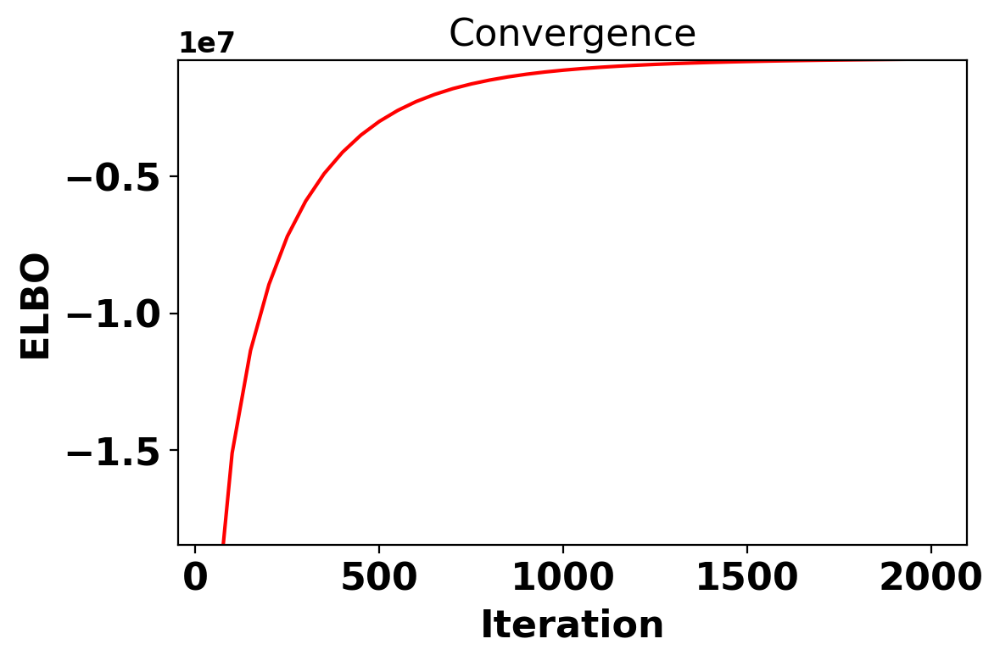

In [9]:
# ELBO
%matplotlib inline
import os
import pandas as pd
import matplotlib.pyplot as plt

folname_diag = "../src/"
fnamex = os.path.join(figfol, 'elbo_best_noc.png')
diag_file_o = os.path.join(folname_diag, f"{uid}_{m_seed}_nb_diag.csv")


# Read ELBO data
nb_elbo = pd.read_csv(diag_file_o, comment='#', header=None)
nb_elbo.columns = ['iter', 'time', 'ELBO']  

# Extract ELBO values
a = nb_elbo['ELBO'].to_numpy()

# Create plot
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
ax.plot(nb_elbo['iter'].to_numpy(), a, c='red')
ax.set_xlabel('Iteration', fontsize=16)
ax.set_ylabel('ELBO', fontsize=16)
ax.tick_params(axis="x", labelsize=16)
ax.tick_params(axis="y", labelsize=16)
ax.set_title('Convergence', fontsize=16)

# Set y-axis limits
ax.set_ylim(-18_475_900, -738_390)

fig.tight_layout()
fig.savefig(fnamex)
plt.show()


##  Scatter plot comparing true and estimated value

In [4]:
n,q = Y.shape

In [11]:
parma_sample  = vbfun.vb_extract_sample(results)
parma_sample  = dict(parma_sample)
print(parma_sample)
parma_mean  = vbfun.vb_extract_mean(results)
parma_mean = dict(parma_mean)
print(parma_mean)
muest = np.zeros((n,q))
muest1 = np.zeros((n,q))

nsample_o = 200
# Initialize arrays
Yte_lpmf = np.zeros((nsample_o, n, q), dtype=np.float64)
mu_sample = np.zeros((nsample_o, n, q), dtype=np.float64)

# Conditional logic based on config
if data == "original" and setting == 1:
    print("Running OLD DATA DIRECT COUPLING")
    for i in range(n):
        for j in range(q):
            muest[i,j] =  parma_mean['C0'][j] + \
                np.matmul(X[i,],parma_mean['C_geo'][j,:]) + \
                np.matmul(S[i,],np.matmul(parma_mean['A_s'],parma_mean['L_sp'][j,:])) + \
                np.matmul(B[i,],np.matmul(parma_mean['A_b'],parma_mean['L_sp'][j,:]));
                #np.matmul(Q[i,],np.matmul(parma_mean['A_m'],parma_mean['L_sp'][j,:])) + \
            if Yi[i,j] == 1:
                temp = copy.copy(Yi[i,:]);temp[j] = 0;
                muest1[i,j] = np.matmul( parma_mean['L_i'][j,:], np.matmul(parma_mean['L_sp'].T,temp))/(Bs[i]-1.0); 
                muest[i,j] = muest[i,j] + muest1[i,j];
            muest[i,j] =  T_i[i]*np.exp(muest[i,j]* parma_mean['tau'][j])

elif data == "original" and setting == 2:
    print("Running OLD DATA NO DIRECT COUPLING")
    for i in range(n):
        for j in range(q):
            muest[i,j] =  parma_mean['C0'][j] + \
                np.matmul(X[i,],np.matmul(parma_mean['A_geo'],parma_mean['L_sp'][j,:])) + \
                np.matmul(S[i,],np.matmul(parma_mean['A_s'],parma_mean['L_sp'][j,:])) + \
                np.matmul(B[i,],np.matmul(parma_mean['A_b'],parma_mean['L_sp'][j,:]));
                #np.matmul(Q[i,],np.matmul(parma_mean['A_m'],parma_mean['L_sp'][j,:])); 
            if Yi[i,j] == 1:
                temp = copy.copy(Yi[i,:]);temp[j] = 0;
                muest1[i,j] = np.matmul( parma_mean['L_i'][j,:], np.matmul(parma_mean['L_sp'].T,temp))/(Bs[i]-1.0); 
                muest[i,j] = muest[i,j] + muest1[i,j];
            muest[i,j] =  T_i[i]*np.exp(muest[i,j]* parma_mean['tau'][j])


elif data == "new" and setting == 2:
    print("Running NEW DATA NO DIRECT COUPLING ")
    for i in range(n):
        for j in range(q):
            muest[i,j] =  parma_mean['C0'][j] + \
                np.matmul(X[i,],np.matmul(parma_mean['A_geo'],parma_mean['L_sp'][j,:])) + \
                np.matmul(S[i,],np.matmul(parma_mean['A_s'],parma_mean['L_sp'][j,:])) + \
                np.matmul(D[i,],np.matmul(parma_mean['A_d'],parma_mean['L_sp'][j,:])) + \
                np.matmul(B[i,],np.matmul(parma_mean['A_b'],parma_mean['L_sp'][j,:]));
                #np.matmul(Q[i,],np.matmul(parma_mean['A_m'],parma_mean['L_sp'][j,:])) + \
            if Yi[i,j] == 1:
                temp = copy.copy(Yi[i,:]);temp[j] = 0;
                muest1[i,j] = np.matmul( parma_mean['L_i'][j,:], np.matmul(parma_mean['L_sp'].T,temp))/(Bs[i]-1.0); 
                muest[i,j] = muest[i,j] + muest1[i,j];
            muest[i,j] =  T_i[i]*np.exp(muest[i,j]* parma_mean['tau'][j])

elif data == "new" and setting == 1:
    print("Running NEW DATA NO DIRECT COUPLING ")
    for i in range(n):
        for j in range(q):
            muest[i,j] =  parma_mean['C0'][j] + \
                np.matmul(X[i,],parma_mean['C_geo'][j,:]) + \
                np.matmul(S[i,],np.matmul(parma_mean['A_s'],parma_mean['L_sp'][j,:])) + \
                np.matmul(D[i,],np.matmul(parma_mean['A_d'],parma_mean['L_sp'][j,:])) + \
                np.matmul(B[i,],np.matmul(parma_mean['A_b'],parma_mean['L_sp'][j,:]));
                #np.matmul(Q[i,],np.matmul(parma_mean['A_m'],parma_mean['L_sp'][j,:])) + \
            if Yi[i,j] == 1:
                temp = copy.copy(Yi[i,:]);temp[j] = 0;
                muest1[i,j] = np.matmul( parma_mean['L_i'][j,:], np.matmul(parma_mean['L_sp'].T,temp))/(Bs[i]-1.0); 
                muest[i,j] = muest[i,j] + muest1[i,j];
            muest[i,j] =  T_i[i]*np.exp(muest[i,j]* parma_mean['tau'][j])
    

else:
    raise ValueError(f"Combination data={data} and setting={setting} not supported yet.")




../utils/vb_stan.py:25: RuntimeWarning: invalid value encountered in multiply
  params = OrderedDict([(name, np.nan * np.empty((n, ) + tuple(shape))) for name, shape in param_shapes.items()])


{'C0': array([[ 1.70968456,  1.58008446,  1.75727586, ...,  3.51660519,
        -0.55588068,  0.93765052],
       [ 1.70662791,  1.65977537,  2.68488412, ...,  2.87356039,
         0.26719788,  1.06037359],
       [ 2.07591284,  1.49428563,  2.27061097, ...,  3.16202553,
        -0.05822794,  1.57653707],
       ...,
       [ 2.16572942,  1.39760326,  1.59624262, ...,  3.52392987,
         0.16964433,  1.77502874],
       [ 1.93246785,  1.39130346,  1.96513886, ...,  3.01458294,
        -0.04877809,  0.70345431],
       [ 1.83194623,  1.87222873,  1.65893138, ...,  3.49463699,
         0.16404698,  1.11537944]]), 'C_geo': array([[[-7.97372490e-02, -1.29321847e-02, -1.34279829e-01, ...,
          8.56160251e-02, -3.18389943e-02,  1.21283491e-02],
        [ 1.24058903e-01,  4.88915204e-02,  1.66518929e-02, ...,
          7.80385171e-02,  2.98667032e-02,  1.83339120e-02],
        [ 3.29481107e-02, -7.03997507e-03, -1.26405810e-01, ...,
          4.07013355e-02,  1.07157090e-02, -2.9569460

In [29]:
#np.matmul(S[i,],np.matmul(parma_mean['A_s'][j,:],parma_mean['L_sp'][j,:])) + \

In [21]:
Y.shape

(180, 1076)

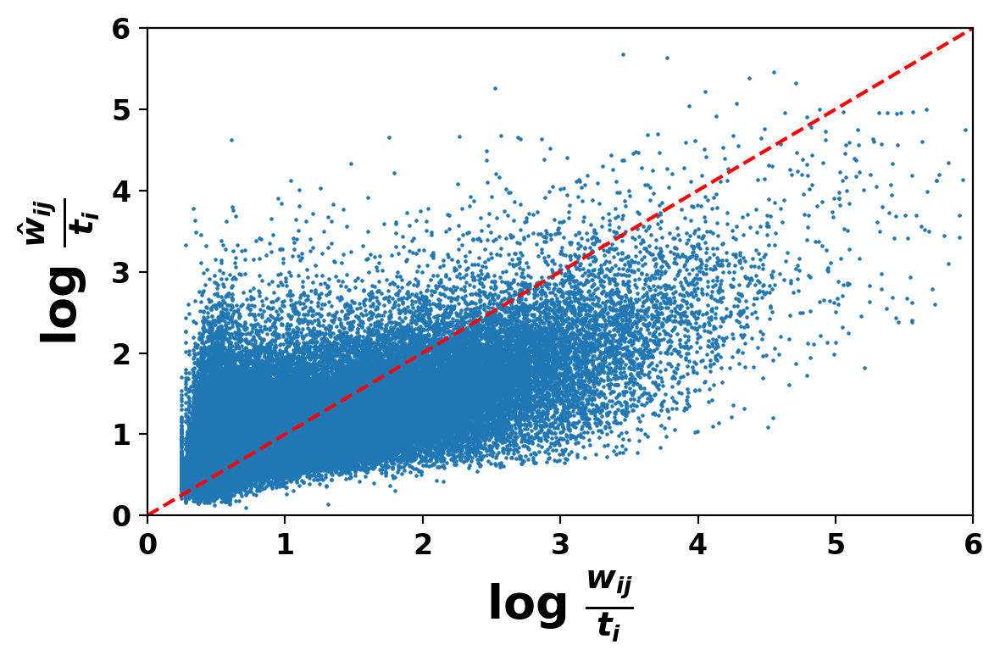

In [6]:
# Scatter plot comparing the entrywise value of the predicted and observed value of the abundance data
fnamex = figfol + 'estimation_comparison_clr.png'
a = (muest.T/T_i)
b = (Y.T/T_i)
a  = np.log(a+1)
b = np.log(b+1)
fig, ax = plt.subplots(figsize = (6,4), dpi =200)
ax.scatter(b.flatten(),a.flatten(), s = 0.4)
temp = np.linspace(0,6)
ax.plot(temp, temp,'--' , color = 'r', lw = 1.5)
ax.set_xlabel('log ' + r'$\frac{w_{ij}}{t_i}$' , fontsize=20)
ax.set_ylabel('log ' + r'$\frac{\hat{w}_{ij}}{t_i}$', fontsize=20)
ax.set_xlim([0,6])
ax.set_ylim([0,6])
fig.tight_layout()
# ax.set_title('Scatter plot')
fig.savefig(fnamex)

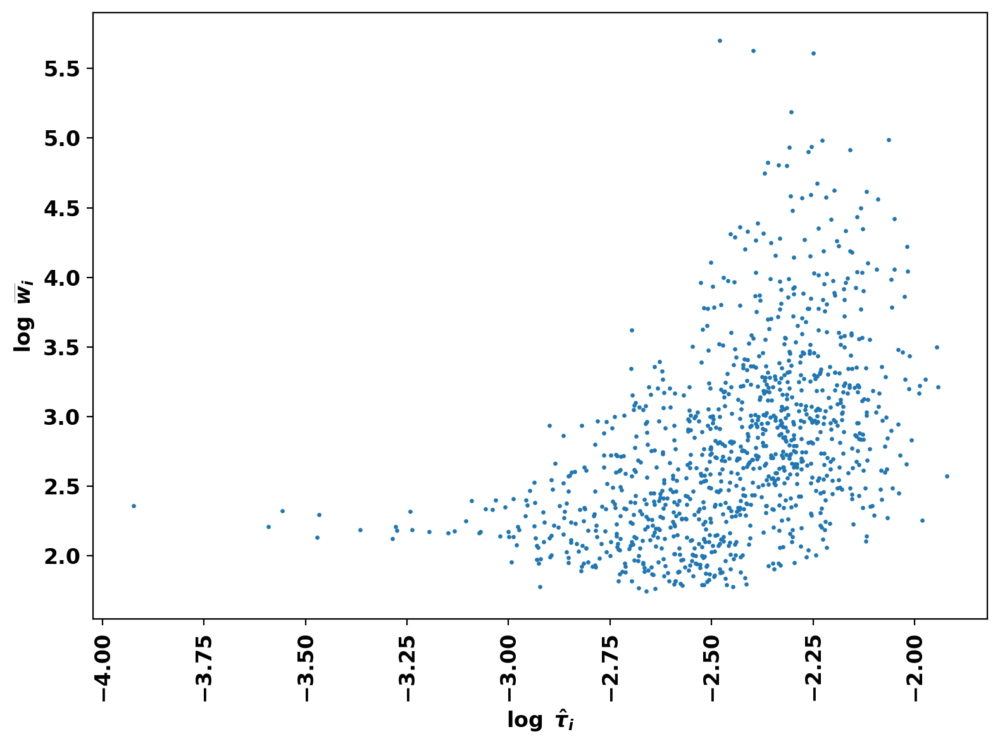

In [7]:
## compare the tau estimate  and mean abundance to understand their association
fnamex = figfol + 'role_tau.png'
b = np.log(parma_mean['tau'])
a = np.log(np.mean(Y, axis= 0))
fig, ax = plt.subplots(figsize = (8,6))
ax.scatter(b,a, s = 2)
ax.set_xlabel(r'$\log\,\,\hat{\tau}_i$')
ax.set_ylabel(r'$\log\,\,\widebar{w}_i$')
# ax.set_title('Scatter plot')
plt.xticks(rotation = 90)
fig.tight_layout()
fig.savefig(fnamex, dpi =200)

##  Comparison of the distribution of observed and predicted value of microbial abundance

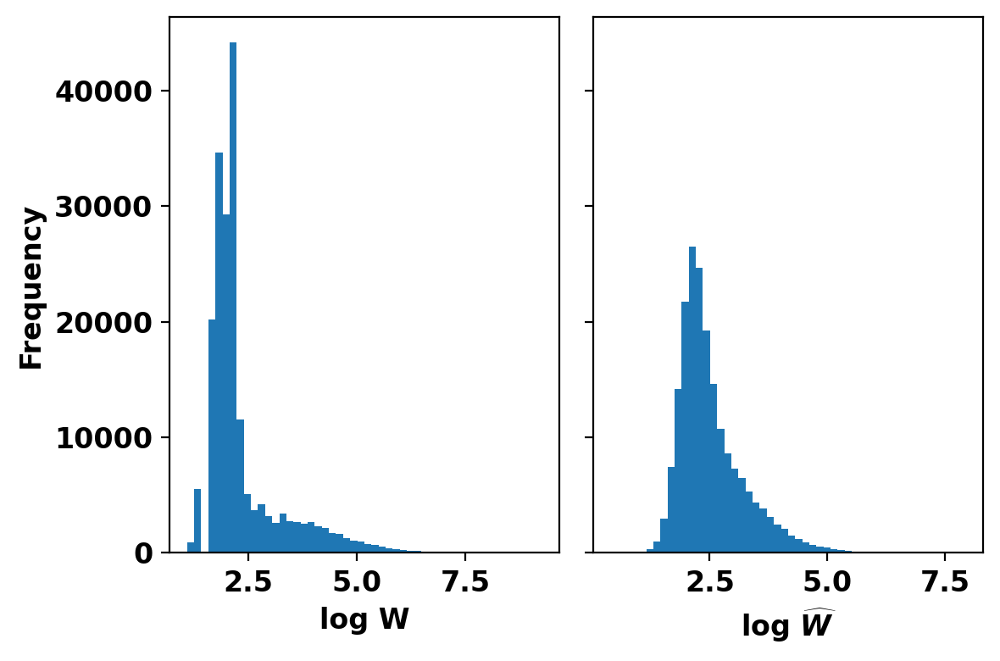

In [8]:
# Histogram to compare the distribution of the observed and predicted value of the abundance of the microbial species 
fnamex = figfol + '*'
fig, (ax1, ax2) = plt.subplots(ncols = 2, sharey = True, figsize = (6,4))
ax1.hist(np.log(np.concatenate(Y)+1), bins = 50)
ax1.set_xlabel('log W')
ax1.set_ylabel('Frequency')
ax2.hist(np.log(np.concatenate(muest)+1), bins = 50)
ax2.set_xlabel('log ' +  r'$\widehat{W}$')
fig.tight_layout()
fig.savefig(fnamex, dpi =200)

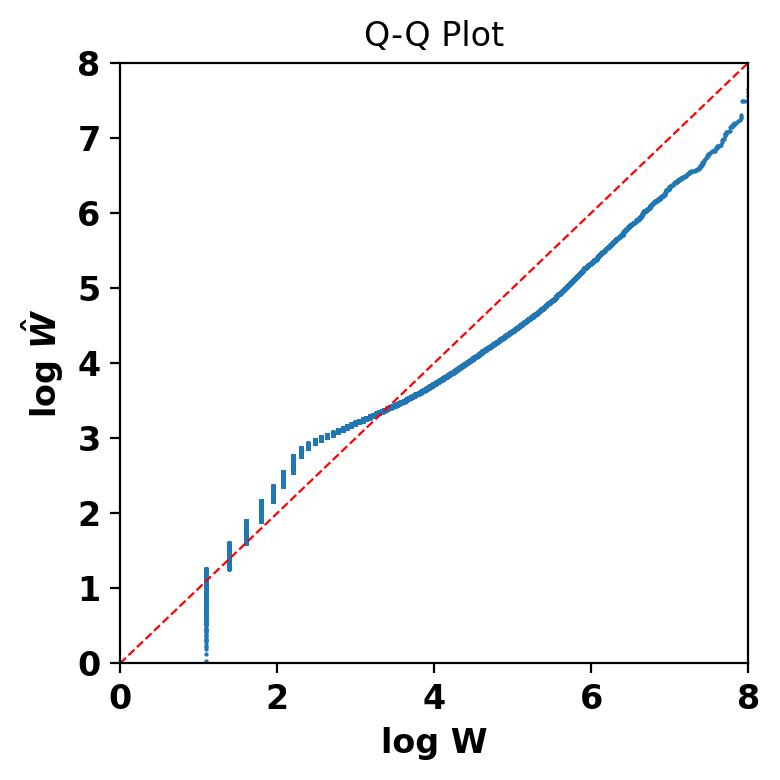

In [12]:
## Q-Q Plot to compare the distribution of the predicted and observed value of the microbial abundance
fnamex = figfol + 'best_Predicted_value.png'
a = np.sort(np.concatenate(Y+1)); 
b =  np.sort(np.concatenate(muest))
fig, ax = plt.subplots(figsize = (4,4))
ax.scatter(np.log(a), np.log(b), s = 0.3)
ax.set_xlabel('log W')
ax.set_ylabel('log ' + r'$\hat{W}$')
ax.set_ylim((0,8))
ax.set_xlim((0,8))
temp = np.linspace(0,8)
ax.plot(temp, temp,'--' , color = 'r', lw = 0.8)
ax.set_title('Q-Q Plot')
fig.tight_layout()
fig.savefig(fnamex, dpi =200)

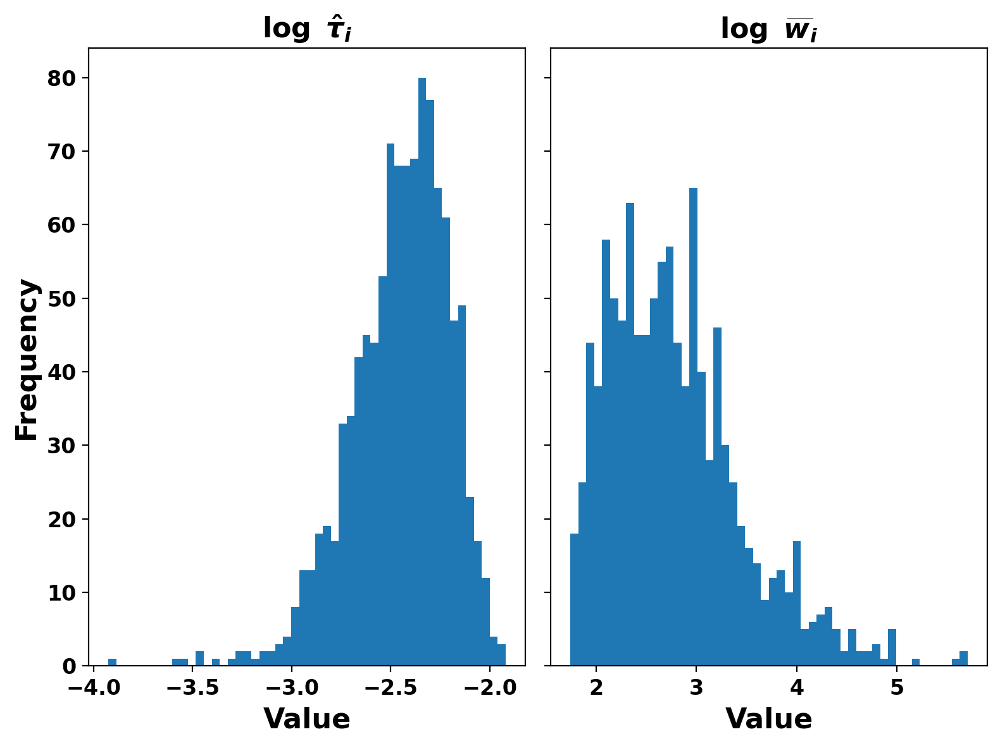

In [10]:
## compare the tau estimate  and mean abundance to understand their association
fnamex = figfol + 'best_tau_vs_spMean_hist.png'
fig, (ax1, ax2) = plt.subplots(ncols = 2, sharey = True, figsize = (8,6))
ax1.hist(np.log(parma_mean['tau']), bins = 50)
ax1.set_title(r'$\log\,\,\hat{\tau}_i$', fontsize =16)
ax1.set_xlabel('Value', fontsize =16)
ax1.set_ylabel('Frequency', fontsize =16)
ax2.hist(np.log(np.mean(Y, axis= 0)), bins = 50)
ax2.set_title(r'$\log\,\,\widebar{w}_i$', fontsize =16)
ax2.set_xlabel('Value', fontsize =16)
fig.tight_layout()
fig.savefig(fnamex, dpi =200)

## Heatmaps comparing the observed and predicted value of microbial abundance

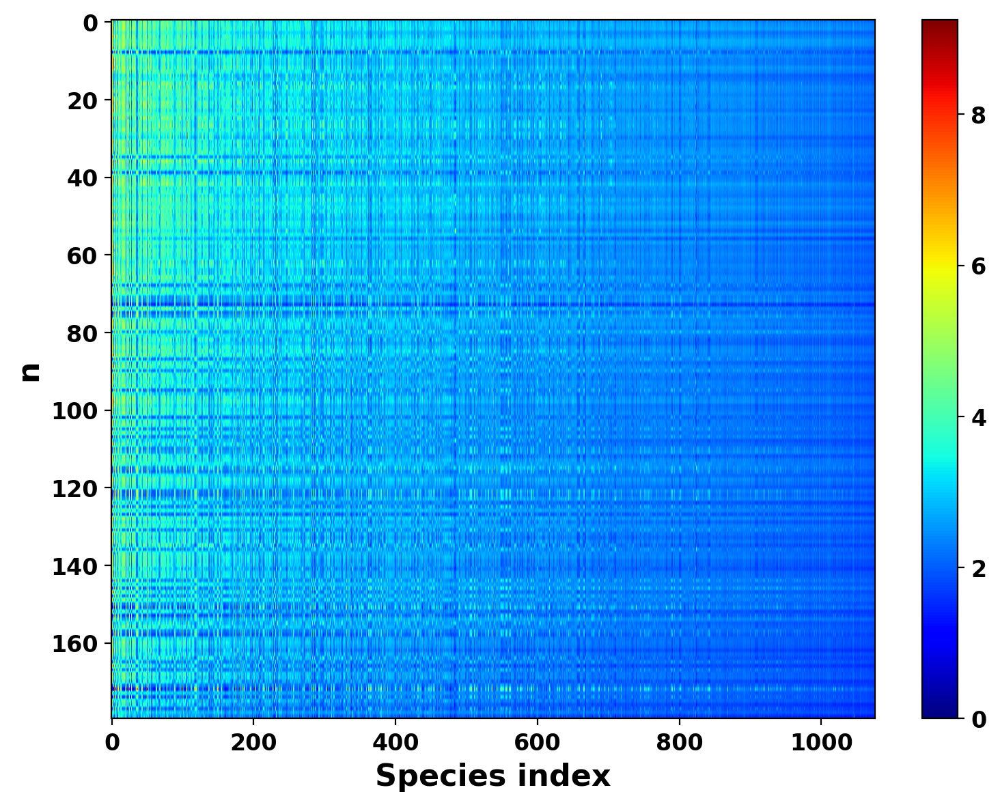

Saved plot: ./plots4/W_predict.png


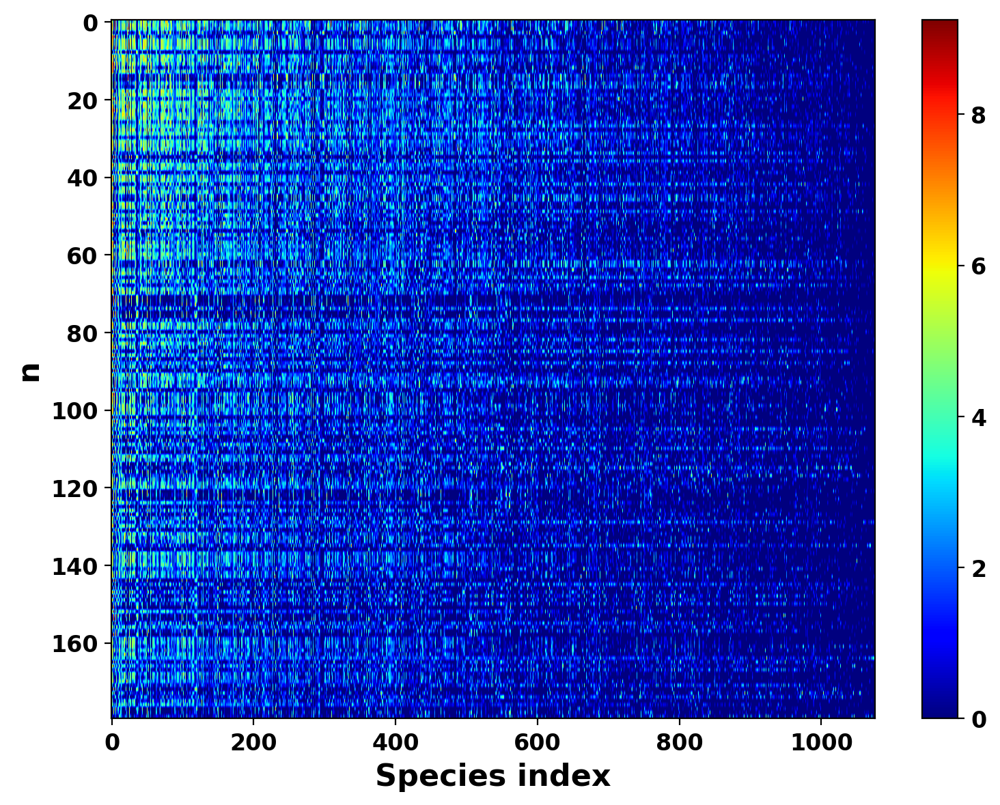

Saved plot: ./plots4/Y1379.png


In [15]:
#without erc_community.pkl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Load data
Y = pd.read_csv(f"../data/{data_path}/Y1.csv").to_numpy()  
Y = Y[:, 2:]  # Remove first two columns if needed
Y = Y.astype(int)  

# Define output folder
os.makedirs(figfol, exist_ok=True)

# Compute transformed values
col_ulim = np.log((Y + 1).max())  # Upper limit for color scale

# Generate sorting indices (if `r_ord` and `c_ordN` are not predefined)
r_ord = np.argsort(-Y.sum(axis=1))  # Sort rows by decreasing sum
c_ordN = np.argsort(-Y.sum(axis=0))  # Sort columns by decreasing sum

# ----------- Plot 1: Predicted abundance (muest) -----------
# Simulate `muest` as predicted values (normally you'd have a model output)

fnamex = os.path.join(figfol, "W_predict.png")
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(np.log(muest[r_ord][:, c_ordN] + 1), vmin=0, vmax=col_ulim, cmap="jet", aspect="auto")
ax.set_xlabel("Species index", fontsize=16)
ax.set_ylabel("n", fontsize=16)
fig.colorbar(im)
fig.tight_layout()
fig.savefig(fnamex, dpi=200)
plt.show()
print(f"Saved plot: {fnamex}")

# ----------- Plot 2: Original abundance data (Y) -----------
fnamex = os.path.join(figfol, "Y1379.png")
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(np.log(Y[r_ord][:, c_ordN] + 1), vmin=0, vmax=col_ulim, cmap="jet", aspect="auto")
ax.set_xlabel("Species index", fontsize=16)
ax.set_ylabel("n", fontsize=16)
fig.colorbar(im)
fig.tight_layout()
fig.savefig(fnamex, dpi=200)
plt.show()
print(f"Saved plot: {fnamex}")


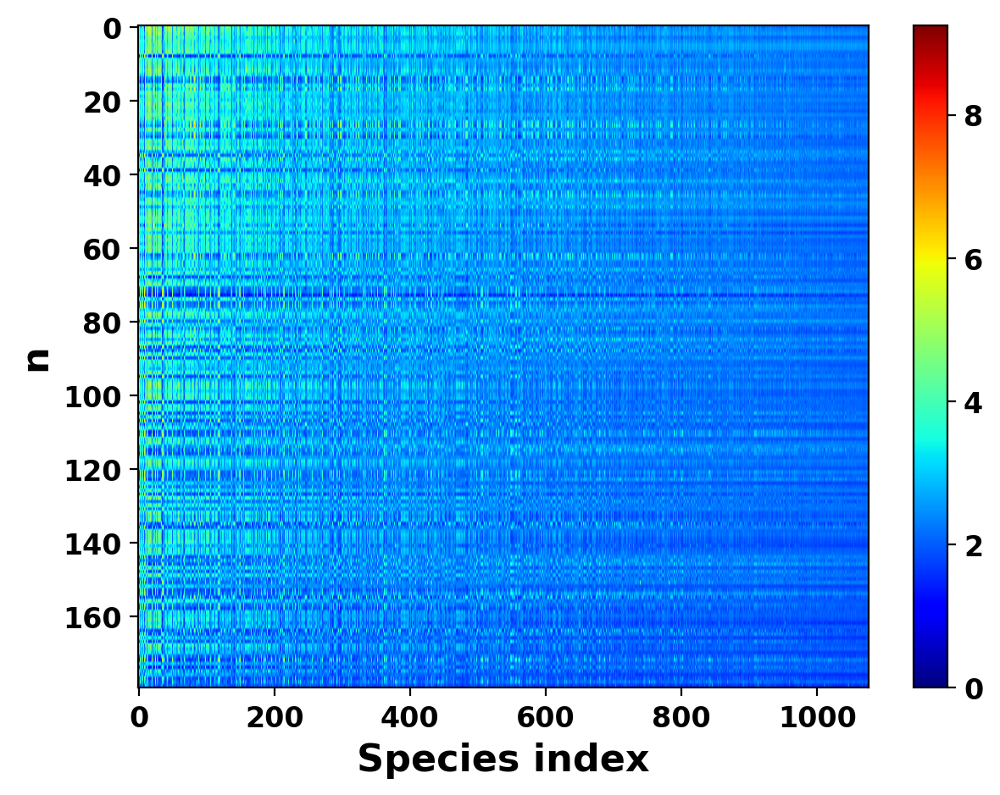

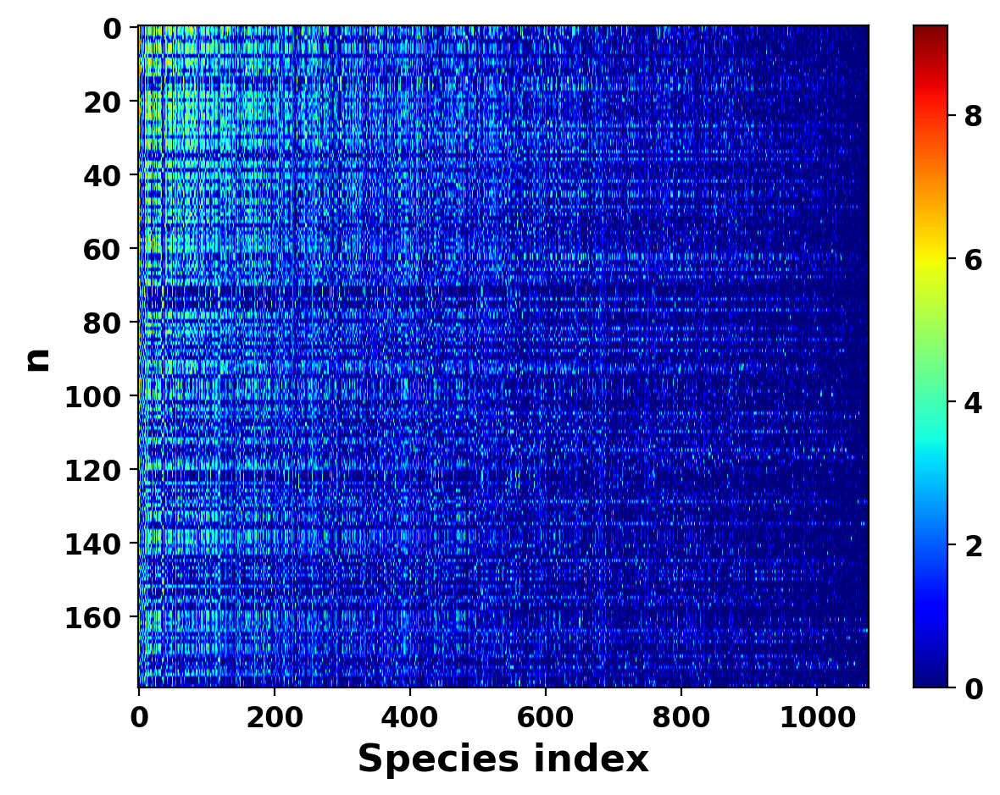

In [12]:
# Predicted value of the abundance data 
fnamex = figfol + 'W_predict.png'
import pylab as pltx
col_ulim = np.log((Y+1).max())
fig, ax = plt.subplots()
im = ax.imshow(np.log(muest[r_ord][:,c_ordN]+1),vmin=0, vmax=col_ulim,cmap='jet', aspect='auto')
ax.set_xlabel('Species index', fontsize = 16)
ax.set_ylabel('n', fontsize = 16)
fig.colorbar(im)
fig.tight_layout()
fig.savefig(fnamex, dpi =200)


# Predicted value of the abundance data 
fnamex = figfol + 'Y1379.png'
import pylab as pltx
col_ulim = np.log((Y+1).max())
fig, ax = plt.subplots()
im = ax.imshow(np.log(Y[r_ord][:,c_ordN]+1),vmin=0, vmax=col_ulim,cmap='jet', aspect='auto')
ax.set_xlabel('Species index', fontsize = 16)
ax.set_ylabel('n', fontsize = 16)
fig.colorbar(im)
fig.tight_layout()
fig.savefig(fnamex, dpi =200)


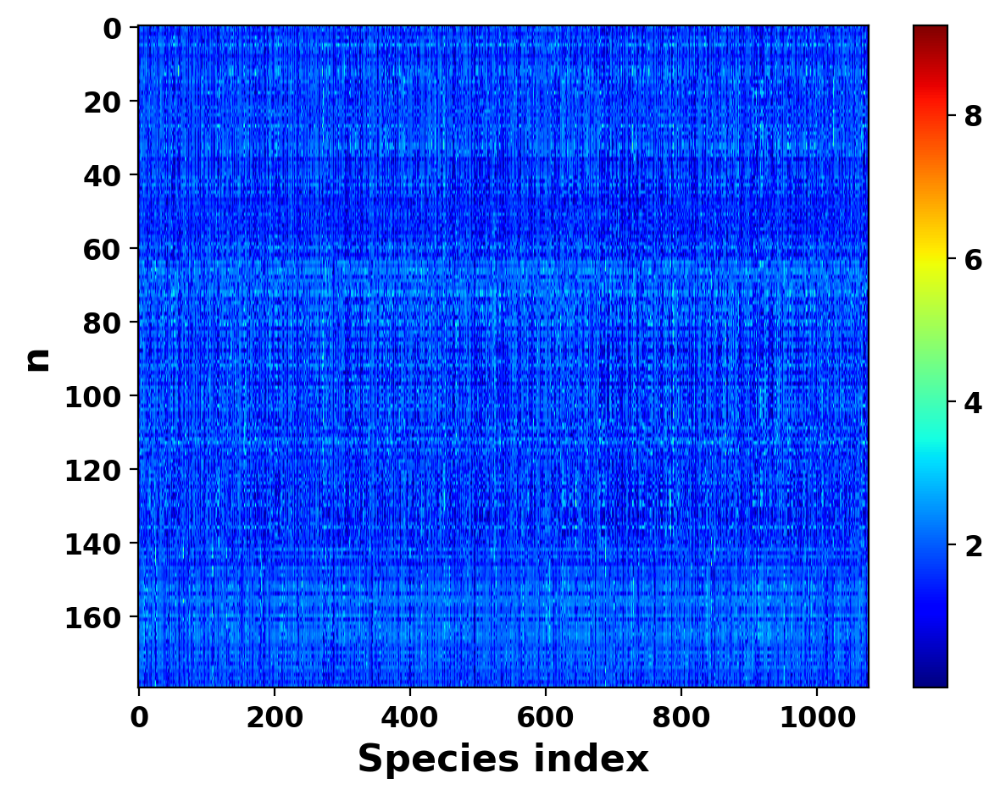

In [13]:
# compare the difference between predicted and observed value of the abbundance on the log-scale
fnamex = figfol + 'modelfit_comparison_diff.png'
col_ulim = np.log((Y+1).max())
tema = np.abs(np.log(muest+1) - np.log(Y+1))
fig, ax = plt.subplots()
im = ax.imshow(tema,cmap='jet',vmax=col_ulim, aspect='auto')
ax.set_xlabel('Species index', fontsize = 16)
ax.set_ylabel('n', fontsize = 16)
fig.colorbar(im)
# ax.set_title('|log ' + r'$\hat{W}$' +  '- log W|')
fig.tight_layout()
fig.savefig(fnamex, dpi =200)

In [14]:
## Compute mean median and mode from the posterior sample estimate
Yte_mode = np.zeros((n,q))
Yte_meadian = np.zeros((n,q))
Yte_mean = np.zeros((n,q))
for i in range(n):
    for j in range(q):
        Yte_mode[i,j] =  np.mean(sf.hpd(Yte_sample[:,i,j], alpha = 0.5))
        Yte_meadian[i,j] = np.median(Yte_sample[:,i,j])
        Yte_mean[i,j] = np.mean(Yte_sample[:,i,j])

        

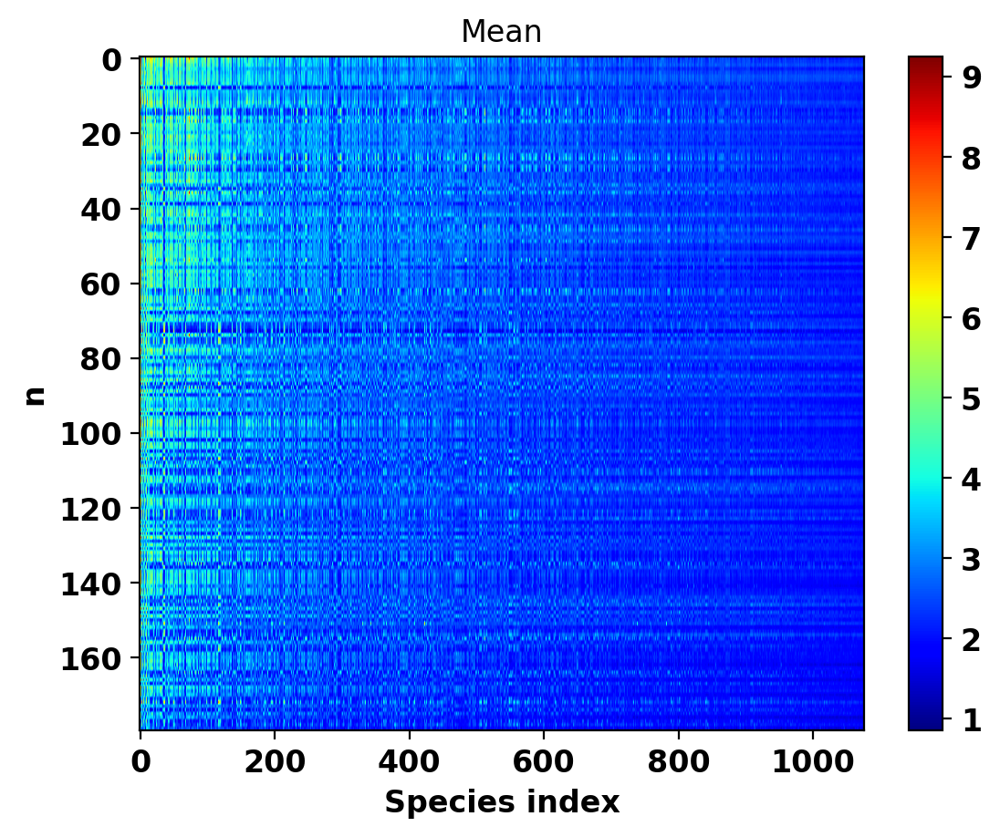

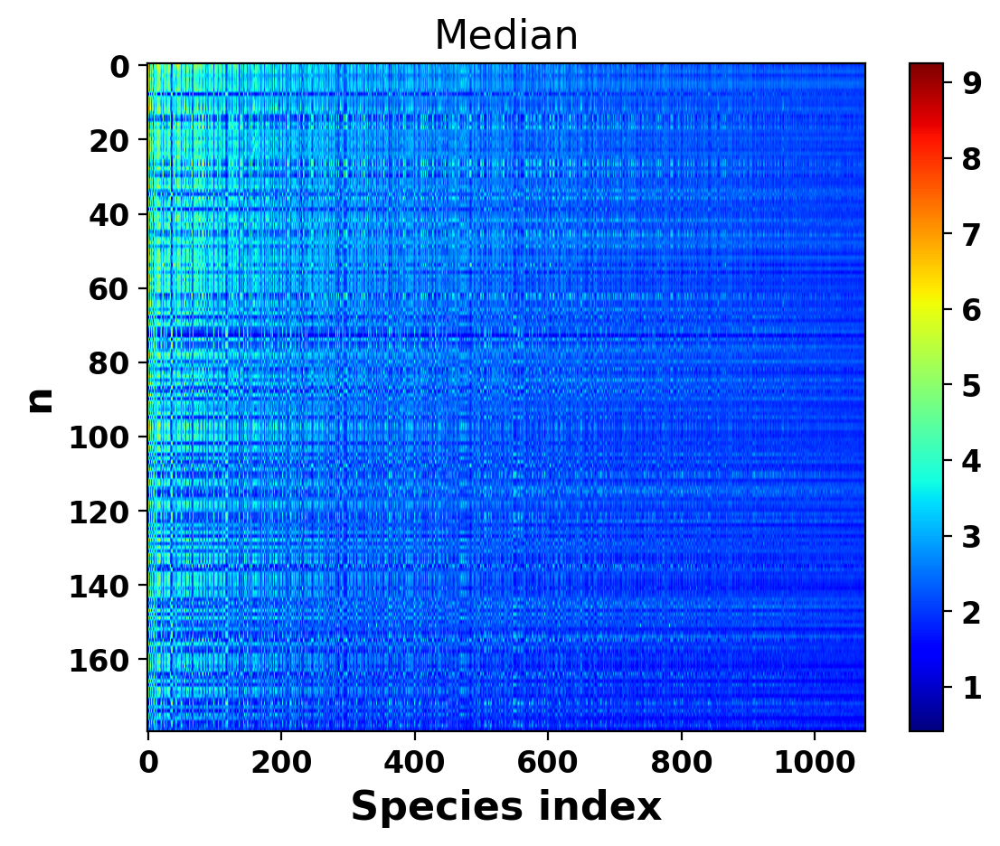

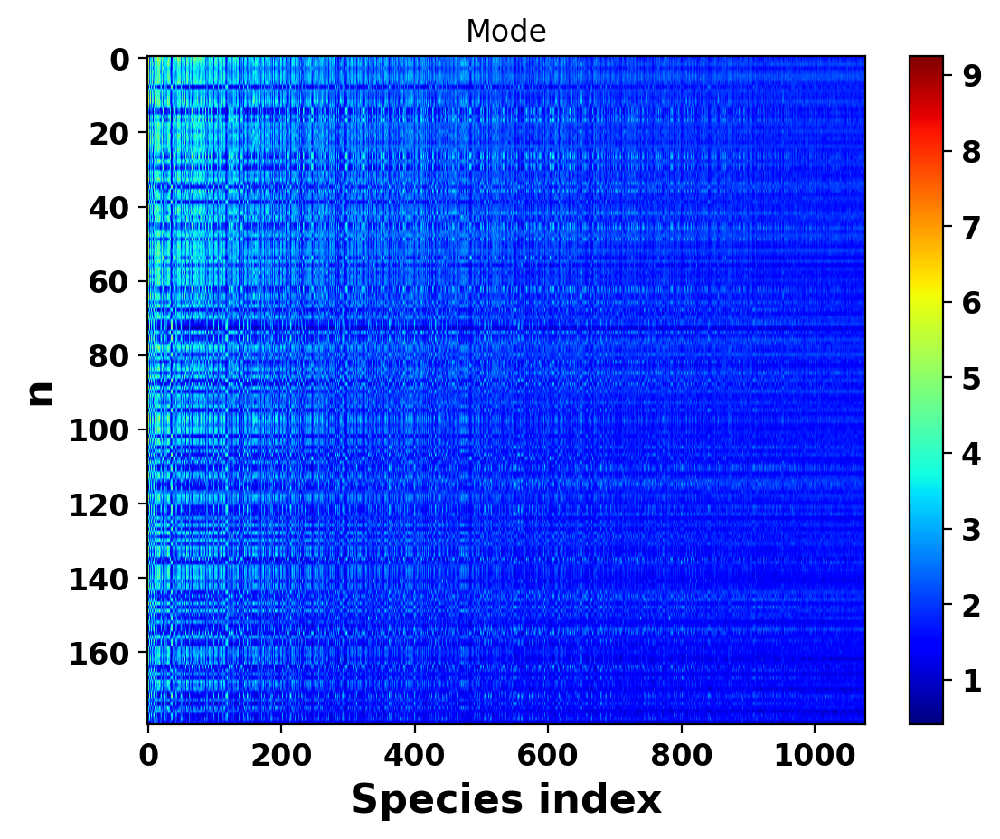

In [15]:
## Visualize mean median and mode from the posterior sample estimate
from matplotlib.backends.backend_pdf import PdfPages
fnamex = figfol + 'mmm_post_sample.pdf'
pp = PdfPages(fnamex)

col_ulim = np.log((Y+1).max())
temp = Yte_mean[r_ord][:,c_ordN]
fig, ax = plt.subplots()
im = ax.imshow(np.log(temp+1),cmap='jet',vmax=col_ulim, aspect='auto')
ax.set_xlabel('Species index')
ax.set_ylabel('n')
fig.colorbar(im)
ax.set_title('Mean')
pp.savefig(fig, dpi =200)

temp = Yte_meadian[r_ord][:,c_ordN]
fig, ax = plt.subplots()
im = ax.imshow(np.log(temp+1),cmap='jet',vmax=col_ulim, aspect='auto')
ax.set_xlabel('Species index', fontsize = 16)
ax.set_ylabel('n', fontsize = 16)
fig.colorbar(im)
ax.set_title('Median', fontsize = 16)
pp.savefig(fig, dpi =200)

temp = Yte_mode[r_ord][:,c_ordN]
fig, ax = pltx.subplots()
im = ax.imshow(np.log(temp+1),cmap='jet',vmax=col_ulim, aspect='auto')
ax.set_xlabel('Species index', fontsize = 16)
ax.set_ylabel('n', fontsize = 16)
fig.colorbar(im)
ax.set_title('Mode')
pp.savefig(fig, dpi =200)
pp.close()


NEW STUFF

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
#added new

# Load microbial abundance data (Y matrix)
Y = pd.read_csv(f'../data/{data_path}/Y1.csv').to_numpy()
Y = Y[:, 2:]  # Exclude first two columns if necessary
Y = Y.astype(int)  # Ensure integer values

# Load species taxonomy annotation
tax_name = pd.read_csv(f'../data/{data_path}/species_tax.csv')
tax_name = tax_name.rename(columns={'Unnamed: 0': 'OTU'})
tax_name = tax_name.iloc[1:].reset_index(drop=True)  # Remove first row if necessary
tax_name.insert(0, 'Id', tax_name['OTU'].str[3:])
tax_name.columns.values[1] = 'Label'

# Load additional ecological classification annotations
tem = pd.read_csv(f'../data/{data_path}/species_tax_anot.amended.csv').iloc[:, [1, 12]]
tax_name = tax_name.merge(tem, on='Label')
tax_name = tax_name.rename(columns={"Ecologically_relevant_classification_aggregated": "ECR"})

# Compute species abundance and update taxonomy
species_abundance = Y.sum(axis=0)
tax_name['Abundance'] = species_abundance
tax_name[['Id']] = tax_name[['Id']].astype(int)
tax_name = tax_name.replace(np.nan, 'Empty')

# Sorting species by abundance
tax_name = tax_name.sort_values(by='Abundance', ascending=False)

# Generate heatmaps
fig, axes = plt.subplots(nrows=2, figsize=(8, 12))

# Top plot: Raw abundance
sns.heatmap(np.log1p(Y), ax=axes[0], cmap='jet', cbar=True)
axes[0].set_xlabel("Species index", fontsize=14)
axes[0].set_ylabel("n", fontsize=14)
axes[0].set_title("Microbial Abundance Heatmap", fontsize=16)

# Bottom plot: Normalized abundance
Y_norm = (Y - Y.mean(axis=0)) / Y.std(axis=0)  # Standardize abundance
sns.heatmap(Y_norm, ax=axes[1], cmap='jet', cbar=True)
axes[1].set_xlabel("Species index", fontsize=14)
axes[1].set_ylabel("n", fontsize=14)
axes[1].set_title("Normalized Microbial Abundance Heatmap", fontsize=16)

plt.tight_layout()
plt.show()


IndexError: positional indexers are out-of-bounds

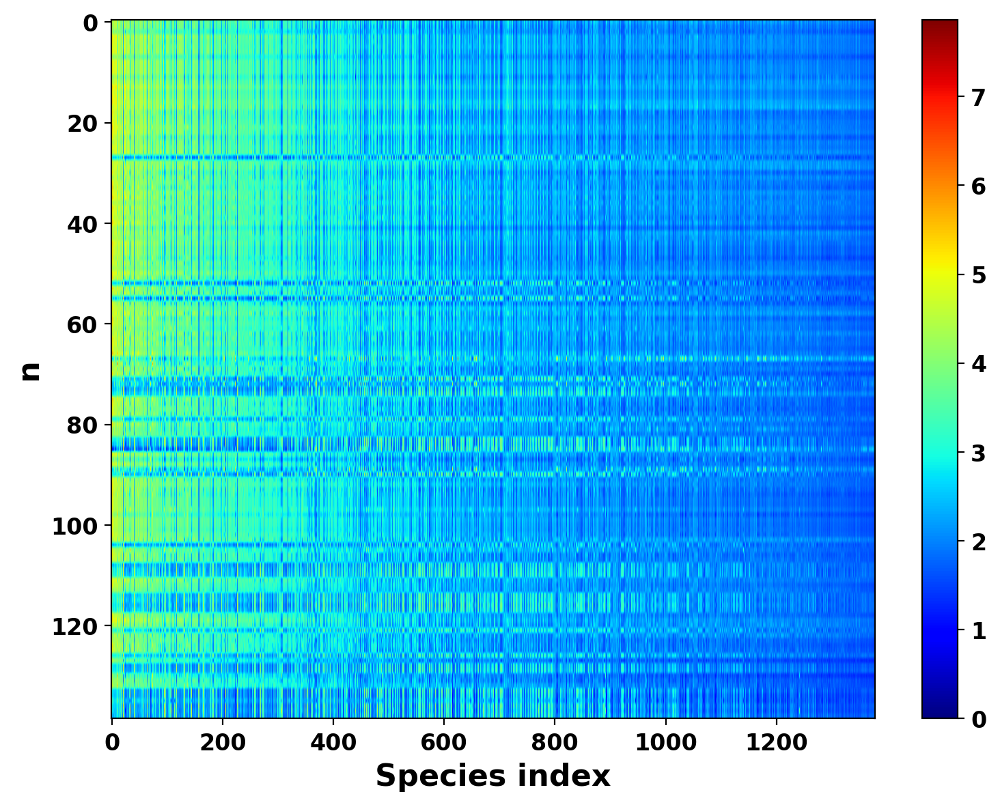

Saved plot: ./plots/W_predict.png


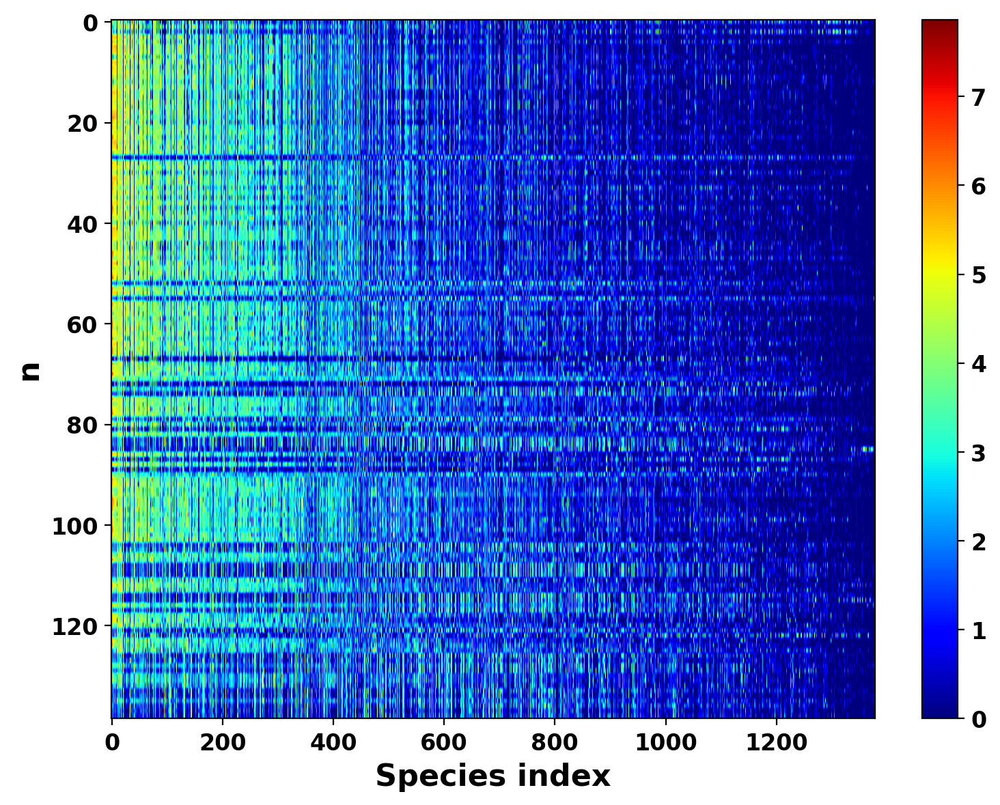

Saved plot: ./plots/Y1379.png


In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# Load data
Y = pd.read_csv(f"../data/{data_path}/Y1.csv").to_numpy()  
Y = Y[:, 2:]  # Remove first two columns if needed
Y = Y.astype(int)  

# Define output folder
figfol = "./plots/"
os.makedirs(figfol, exist_ok=True)

# Compute transformed values
col_ulim = np.log((Y + 1).max())  # Upper limit for color scale

# Generate sorting indices (if `r_ord` and `c_ordN` are not predefined)
r_ord = np.argsort(-Y.sum(axis=1))  # Sort rows by decreasing sum
c_ordN = np.argsort(-Y.sum(axis=0))  # Sort columns by decreasing sum

# ----------- Plot 1: Predicted abundance (muest) -----------
# Simulate `muest` as predicted values (normally you'd have a model output)

fnamex = os.path.join(figfol, "W_predict.png")
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(np.log(muest[r_ord][:, c_ordN] + 1), vmin=0, vmax=col_ulim, cmap="jet", aspect="auto")
ax.set_xlabel("Species index", fontsize=16)
ax.set_ylabel("n", fontsize=16)
fig.colorbar(im)
fig.tight_layout()
fig.savefig(fnamex, dpi=200)
plt.show()
print(f"Saved plot: {fnamex}")

# ----------- Plot 2: Original abundance data (Y) -----------
fnamex = os.path.join(figfol, "Y1379.png")
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(np.log(Y[r_ord][:, c_ordN] + 1), vmin=0, vmax=col_ulim, cmap="jet", aspect="auto")
ax.set_xlabel("Species index", fontsize=16)
ax.set_ylabel("n", fontsize=16)
fig.colorbar(im)
fig.tight_layout()
fig.savefig(fnamex, dpi=200)
plt.show()
print(f"Saved plot: {fnamex}")


/dss/dsshome1/09/ra64nef3/.conda/envs/vim/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "figsize" which is no longer supported as of 3.3 and will become an error in 3.6
  del sys.path[0]


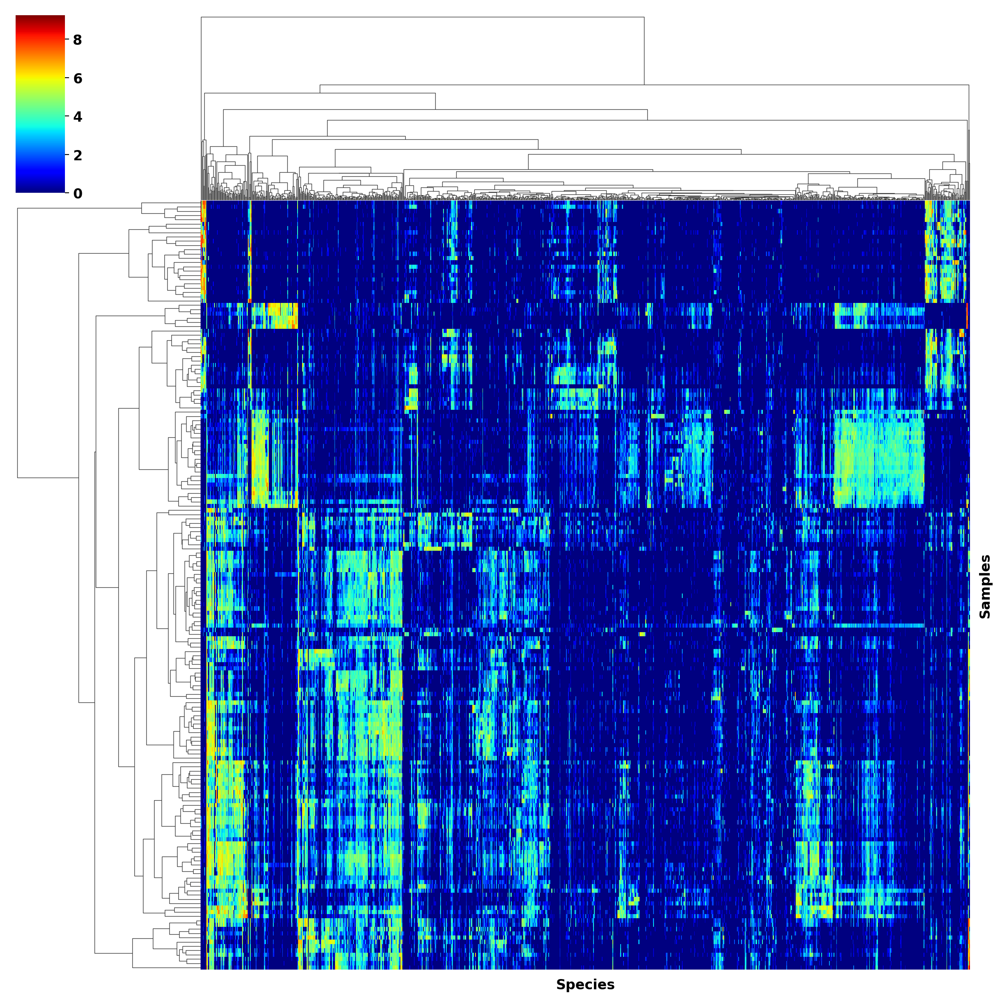

In [19]:
np.random.seed(123)
r_ordx = sch.linkage(Y ,metric = 'euclidean',\
                           optimal_ordering = True, method="ward")

c_ordx = sch.linkage(Y.T,metric = 'euclidean',\
                           optimal_ordering = True, method="ward")
sp_ord = sch.leaves_list(c_ordx)

g = sns.clustermap(np.log(Y+1),col_linkage =  c_ordx, row_linkage = r_ordx,\
                   cmap="jet", yticklabels=False, xticklabels=False, figsize=(12, 12))
g.ax_heatmap.set_xlabel('Species', fontsize = 12)
g.ax_heatmap.set_ylabel('Samples', fontsize = 12)
plt.savefig(figfol + 'original.png', dpi =200, figsize = (20,20))

/dss/dsshome1/09/ra64nef3/.conda/envs/vim/lib/python3.7/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "figsize" which is no longer supported as of 3.3 and will become an error in 3.6


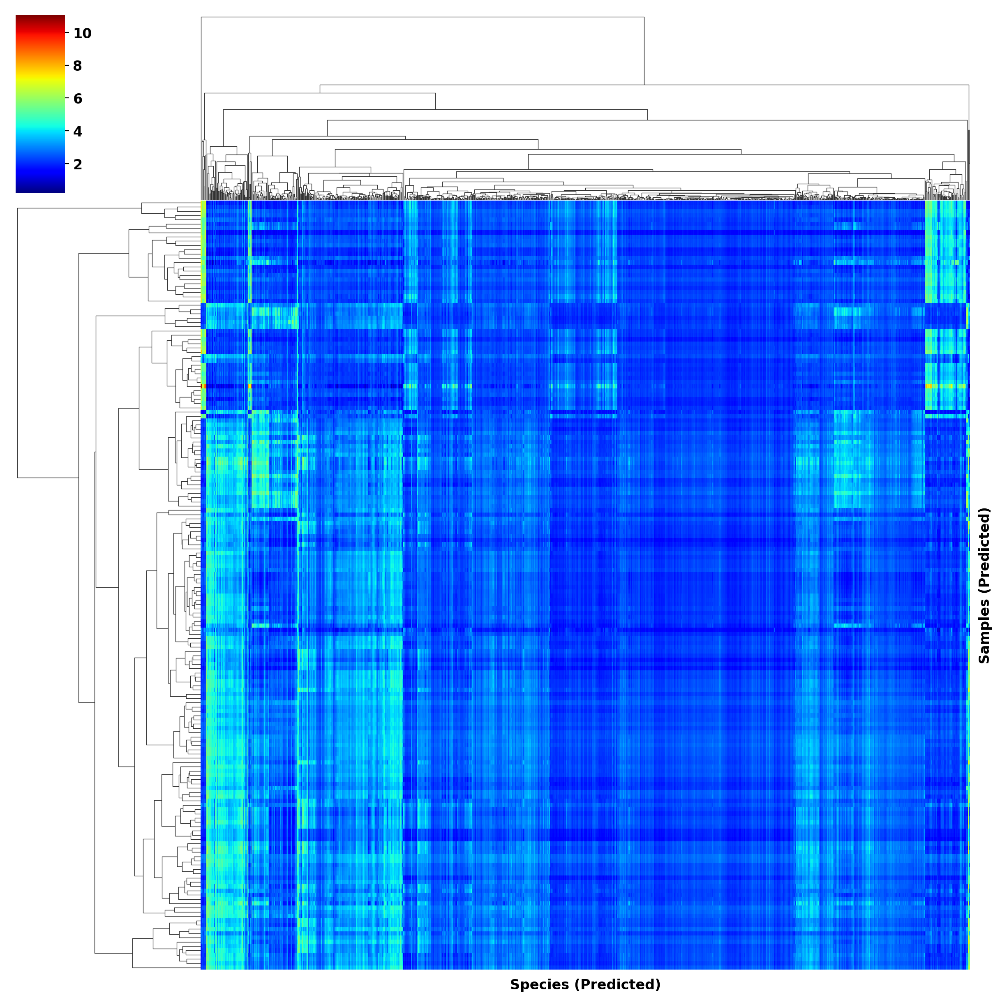

In [20]:
import scipy.cluster.hierarchy as sch
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# Optional: Set the same random seed for reproducibility
np.random.seed(123)

# Hierarchical clustering on predicted data (muest)
r_ordx_pred = sch.linkage(muest, metric='euclidean', optimal_ordering=True, method='ward')
c_ordx_pred = sch.linkage(muest.T, metric='euclidean', optimal_ordering=True, method='ward')
sp_ord_pred = sch.leaves_list(c_ordx_pred)

# Create clustermap
g_pred = sns.clustermap(np.log(muest + 1),
                        col_linkage=c_ordx, #or c_ordx_pred 
                        row_linkage=r_ordx, #or r_ordx_pred
                        cmap="jet",
                        yticklabels=False,
                        xticklabels=False,
                        figsize=(12, 12))

# Label axes
g_pred.ax_heatmap.set_xlabel('Species (Predicted)', fontsize=12)
g_pred.ax_heatmap.set_ylabel('Samples (Predicted)', fontsize=12)

# Save figure
plt.savefig(figfol + 'predicted.png', dpi=200, figsize=(20, 20))